# Analyse des données Vélib dans R : 



#### Le jeu de données à analyser présente les relevés de profils de chargement de stations Vélib. Notre objectif est d'identifier les tendances qui s'en dégagent. 

In [1]:
rm(list = ls())   # erase everything, start from scratch!

In [2]:
install.packages('gridExtra')
library(ggplot2)
library(reshape2)
library(gridExtra)

Installation du package dans ‘/home/hountong/R/libs’
(car ‘lib’ n'est pas spécifié)



## I- Analyse exploratoire des données

L'une des premières étapes dans l'analyse de données est la visualisation de celles-ci. 

In [3]:
load('data/velib.RData')
summary(velib)

         Length Class      Mode     
data      181   data.frame list     
position    2   data.frame list     
dates     181   -none-     character
bonus    1189   -none-     numeric  
names    1189   -none-     character

Du jeu de données Vélib nous allons extraire deux dataframes : data et position que nous avons renommé "loading" et "coord". 

In [4]:
# data preparation

loading = as.matrix(velib$data)
colnames(loading) = 1:ncol(loading)
rownames(loading) = velib$names
stations = 1:nrow(loading)
# on remarque que certains relevés ne correspondent pas à la durée d'étude demandée -une semaine- nous allons donc enlever les treize premières heures du relevé pour avoir une semaine complète.
dates = 14:181
loading = loading[stations, dates]


head(loading)
print("Nombre de stations : ")
print( nrow(loading))

,14,15,16,17,18,19,20,21,22,23,⋯,172,173,174,175,176,177,178,179,180,181
EURYALE DEHAYNIN,0.03846154,0.03846154,0.07692308,0.03846154,0.03846154,0.03846154,0.03846154,0.03846154,0.10714286,0.00000000,⋯,0.29629630,0.11111111,0.1111111,0.14814815,0.30769231,0.07692308,0.11538462,0.07692308,0.1538462,0.1538462
LEMERCIER,0.47826087,0.47826087,0.47826087,0.43478261,0.43478261,0.43478261,0.43478261,0.43478261,0.26086957,0.04347826,⋯,0.04347826,0.00000000,0.2173913,0.13043478,0.04545455,0.17391304,0.17391304,0.17391304,0.2608696,0.3913043
MEZIERES RENNES,0.21818182,0.14545455,0.12727273,0.10909091,0.10909091,0.10909091,0.09090909,0.09090909,0.05454545,0.10909091,⋯,0.25925926,0.25925926,0.2037037,0.12962963,0.14814815,0.29629630,0.31481481,0.37037037,0.3703704,0.4074074
FARMAN,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,0.95238095,1.00000000,1.00000000,1.00000000,⋯,1.00000000,1.00000000,0.9047619,0.85714286,0.85714286,0.85714286,0.76190476,0.76190476,0.7619048,0.7619048
QUAI DE LA RAPEE,0.92753623,0.81159420,0.73913043,0.72463768,0.72463768,0.72463768,0.72463768,0.72463768,0.75362319,0.97101449,⋯,0.22727273,0.45454545,0.5909091,0.83333333,1.00000000,0.81818182,0.63636364,0.71212121,0.6212121,0.5757576
CHOISY POINT D'IVRY,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.16666667,0.08333333,0.00000000,⋯,0.34782609,0.08695652,0.1153846,0.08695652,0.13043478,0.08695652,0.08695652,0.43478261,0.3913043,0.5217391


[1] "Nombre de stations : "
[1] 1189


Le dataframe loading contient le ratio de remplissage (nombre de vélos disponibles par rapport au nombre total) de chaque station. Cela signifie que si le ratio est proche de 1, la station est remplie, et inversement. Les relevés ont été faits toutes les heures pendant 7 jours.
D'un point de vue statistique, les 1189 stations correspondent aux individus et les 168 heures (7x24) aux variables. 


In [5]:

coord = velib$position[stations,]
coord$bonus = velib$bonus[stations]

colnames(loading) = 1:length(dates)

head(coord)

,longitude,latitude,bonus
,<dbl>,<dbl>,<dbl>
19117,2.377389,48.88630,0
17111,2.317591,48.89002,0
6103,2.330447,48.85030,0
15042,2.271396,48.83373,0
12003,2.366897,48.84589,0
13038,2.363335,48.82191,0


Le dataframe coord contient la position gps des stations (longitude, latitude) et indique, grâce à la variable bonus, si elles sont sur une colline ou pas.
D'un point de vue statistique, nous avons 1189 individus et 3 variables.


### Evolution du remplissage dans le temps

Pour illustrer l'évolution du remplissage des stations dans le temps, nous avons pris au hasard 4 stations. 

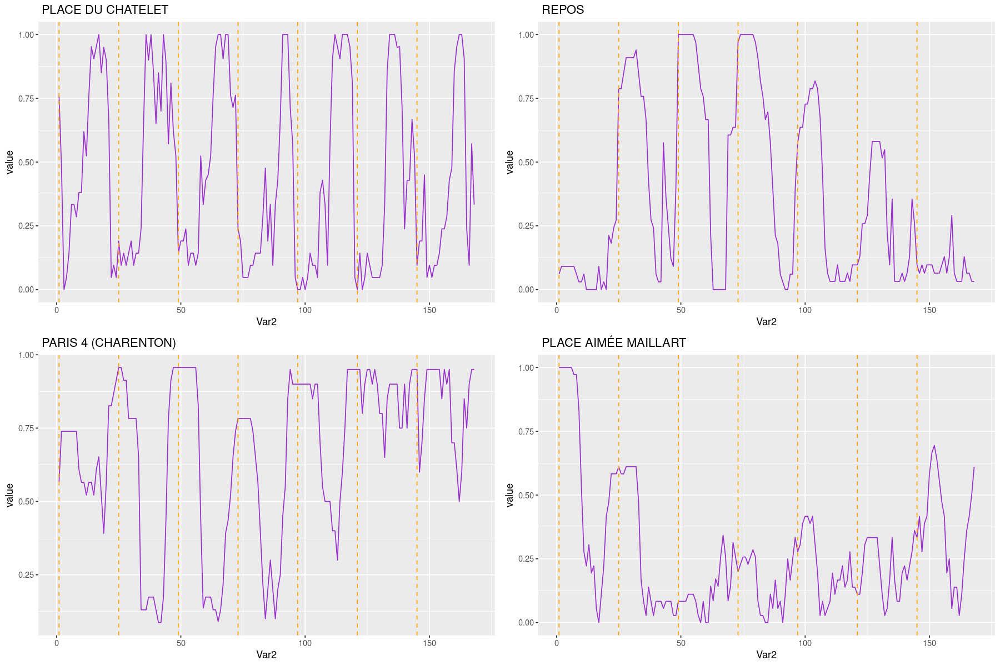

In [6]:
options(repr.plot.width = 15, repr.plot.height = 10)

timeTick = 1 + 24*(0:6)  #  vecteur délimitant les jours

# selection de 4 stations
stations = sample.int(nrow(loading), 4)

df = melt(loading[stations,])

p = list()
for (i in 1:4){
    dfi = df[df$Var1 == velib$names[stations[i]],]
    p[[i]] = ggplot(dfi, aes(x=Var2, y=value)) + 
        geom_line(col="darkorchid") + 
        geom_vline(xintercept=timeTick, col="orange", linetype="dashed") +
        labs(title=velib$names[stations[i]])
}
do.call(grid.arrange,p)

ACPPour une station donnée, nous avons représenté le ratio de changement en fonction du temps et délimité les jours de la semaine.
En analysant les graphiques, nous voyons que des tendances se dégagent. Le comportement de remplissage des stations semble changer selon que le jour soit ouvré ou pas, qu'on soit le jour ou la nuit. 

### Boxplot des variables

NULL

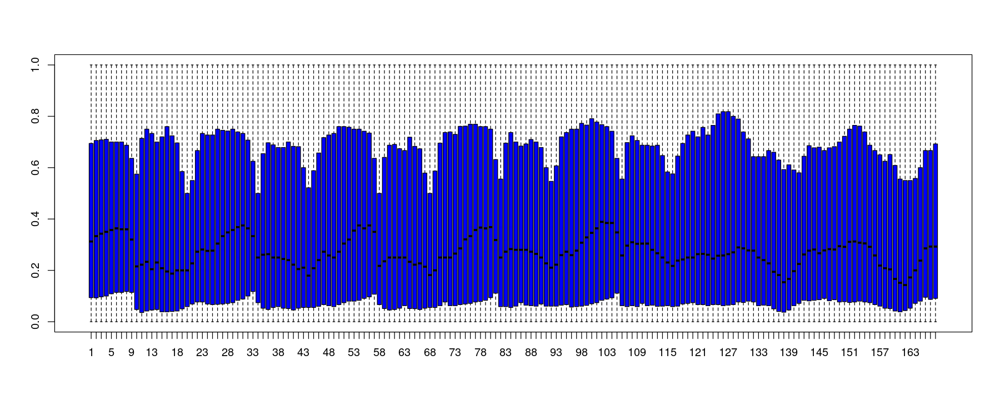

In [7]:
options(repr.plot.width = 15, repr.plot.height = 6)
timeTick = 1 + 24*(0:6)
#col = rainbow(ncol(loading)))
boxplot(loading,col="blue")  + geom_vline(xintercept=timeTick, col="orange", linetype="dashed")

On remarque que toutes les variables ne sont pas à la même échelle. Ce qui traduit le fait que le remplissage ne suit pas la même distribution selon l'heure et le jour. De même, les données ne sont pas symétriques puisque les médianes ne sont pas au milieu des boîtes à moustache. 
Les échelles des valeurs sont toutes entre 0 et 1, ce qui correspond à la plage de valeurs d'un ratio. Il n'y a donc pas de valeurs incohérentes (négatives ou supérieures à 1).
Ce graphique confirme les hypothèses émises plus haut : le comportement des stations dépend du jour de la semaine (ouvré ou non) et du moment dans la journée.


 ### Comportement moyen du remplissage

In [8]:
print('Moyenne de remplissage :')
print(mean(loading))


print('En moyenne, la station la moins remplie est :')
i = which.min(rowMeans(loading)) 
print(rowMeans(loading)[i])



print('En moyenne, la station la plus remplie est : ')
i = which.max(rowMeans(loading))
print(rowMeans(loading)[i])

[1] "Moyenne de remplissage :"
[1] 0.3816218
[1] "En moyenne, la station la moins remplie est :"
 HORNET (BAGNOLET) 
        0.01613284 
[1] "En moyenne, la station la plus remplie est : "
 INSURRECTION AOUT 1944 (IVRY) 
                     0.9193723 


En moyenne, les stations sont remplies à 38%. Pour information, la station Hornet est en moyenne la plus vide et la station insurrection août 1944 est la plus remplie. En recherche de Vélib, nous vous conseillons donc de vous diriger vers Ivry plutôt que Bagnolet.

Nous allons maintenant nous intéresser au remplissage moyen par station, et le comparer au remplissage moyen de l'entièreté des données.

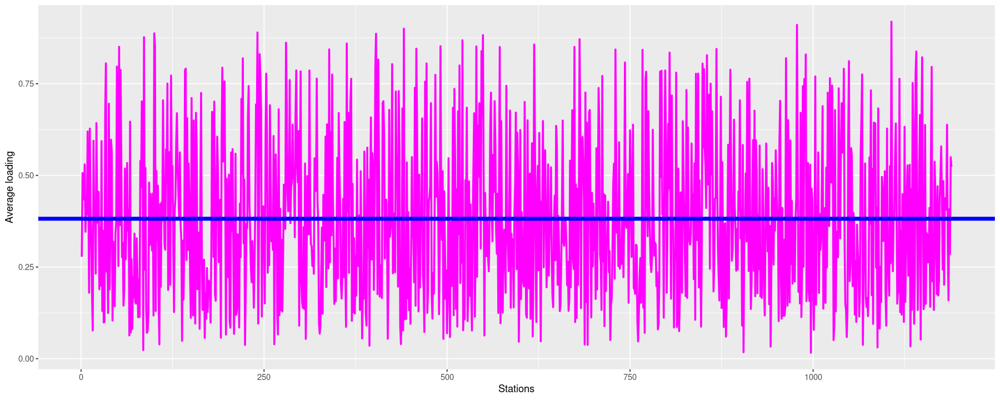

In [9]:

options(repr.plot.width = 15, repr.plot.height = 6)

df = data.frame(stations = c(1:nrow(loading)), mean = rowMeans(loading))
ggplot(df, aes(x = stations, y= mean)) + 
    geom_line(color = 'magenta', linewidth=1) +
    geom_hline(yintercept = mean(loading), color = 'blue', linewidth=2) +
    labs(x = "Stations", y = "Average loading")

On observe sur ce graphe une grande disparité parmi les moyennes. En effet, la ligne bleue représente le remplissage moyen de toutes les stations, et le graph rose représente le remplissage moyen par station. De ce graphique on apprend que la moyenne du remplissage est très différente selon les stations. On peut donc dire que les stations n'ont pas le même comportement.
On peut également se poser la question de la périodicité journalière du remplissage des stations.

           [,1]      [,2]      [,3]      [,4]      [,5]      [,6]      [,7]
 [1,] 0.4015033 0.4000947 0.3932526 0.3973553 0.3965984 0.3905062 0.3861085
 [2,] 0.4087699 0.4110822 0.4063676 0.4085784 0.4086590 0.3961415 0.3896258
 [3,] 0.4117179 0.4159028 0.4168268 0.4192541 0.4174196 0.3935149 0.3874670
 [4,] 0.4151612 0.4205856 0.4212444 0.4245748 0.4251306 0.3970606 0.3916208
 [5,] 0.4171360 0.4217593 0.4243350 0.4282479 0.4307652 0.4042419 0.3987399
 [6,] 0.4216497 0.4265196 0.4286786 0.4328533 0.4371128 0.4076126 0.4074043
 [7,] 0.4198597 0.4265641 0.4287101 0.4314876 0.4353962 0.4129303 0.4129987
 [8,] 0.4157290 0.4216678 0.4240787 0.4252031 0.4278648 0.4132642 0.4150784
 [9,] 0.3846582 0.3864353 0.3871152 0.3844085 0.3883974 0.4092031 0.4126909
[10,] 0.3263314 0.3149544 0.3127752 0.3321468 0.3392637 0.4010459 0.4048583
[11,] 0.3717027 0.3687787 0.3616261 0.3831291 0.3868497 0.3869436 0.3887208
[12,] 0.3830675 0.3779989 0.3745734 0.3916636 0.3966010 0.3726021 0.3709290
[13,] 0.3775

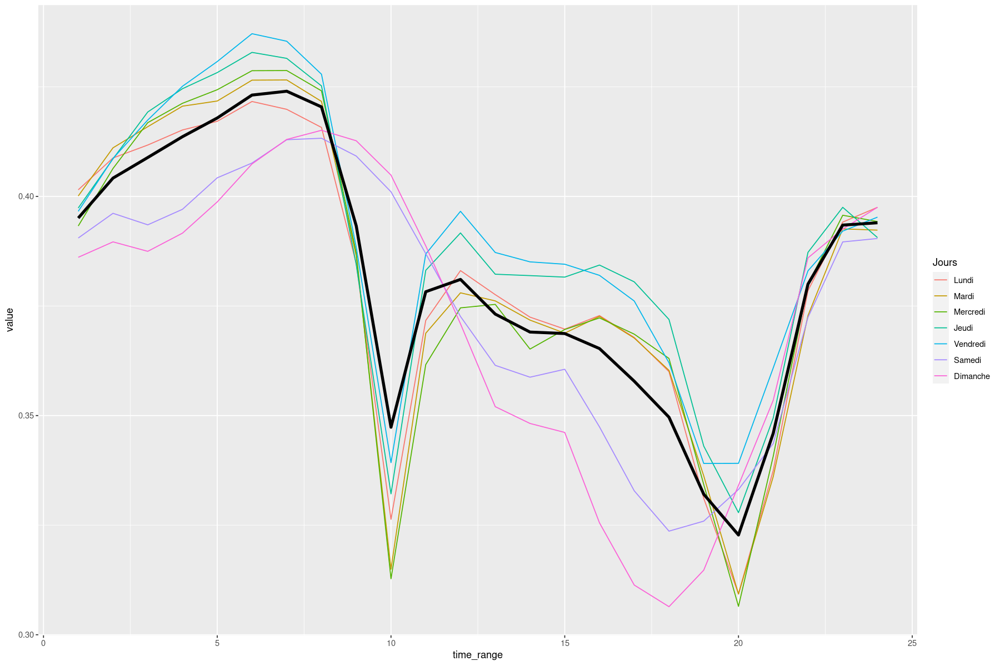

In [10]:
moyHJ = colMeans(loading)
moyHJ = matrix(moyHJ, nrow = 24)
moyH         = rowMeans(moyHJ)

print(moyHJ)
moyHJ            = as.data.frame(moyHJ)
colnames(moyHJ)  = list("Lundi", "Mardi", "Mercredi","Jeudi", "Vendredi", "Samedi", "Dimanche")
moyHJ$time_range = c(1:24)
moyHJ            = melt(moyHJ, id='time_range', variable.name='Jours')

moyH            = as.data.frame(moyH)
colnames(moyH)  = list("Hebdomadaire")
moyH$time_range = c(1:24)


options(repr.plot.width = 15, repr.plot.height = 10)

ggplot() + 
    geom_line(data=moyHJ, aes(x=time_range, y=value, color=Jours)) + 
    geom_line(data=moyH, aes(x=time_range, y=Hebdomadaire), linewidth = 1.5)

Ci-dessus nous retrouvons l'évolution heure par heure du remplissage, et ce pour chaque jour de la semaine étudiée. En noir, nous avons la moyenne heure par heure pour tous les jours. De ce graphique nous pouvons tirer comme information que les cinq premiers jours de la semaine ont une allure plutôt similaire, notamment quand on regarde les creux de 10h et 20h et l'allure des graphes. Les différence viennent prinicpalement du weekend. Ceci confirme que par la suite il sera judicieux de séparer la semaine en deux : jours ouvrés et weekend.

### Map des stations 

# Installation ggmap, ignorer 

In [11]:
install.packages('ggmap')
library(ggmap)
#8a1c3842-4449-4c60-bb9a-2e274c3bda05
register_stadiamaps("8a1c3842-4449-4c60-bb9a-2e274c3bda05", write = TRUE)

Installation du package dans ‘/home/hountong/R/libs’
(car ‘lib’ n'est pas spécifié)

ℹ Google's Terms of Service: <https://mapsplatform.google.com>
  Stadia Maps' Terms of Service: <https://stadiamaps.com/terms-of-service/>
  OpenStreetMap's Tile Usage Policy: <https://operations.osmfoundation.org/policies/tiles/>
ℹ Please cite ggmap if you use it! Use `citation("ggmap")` for details.
ℹ Replacing old key (8a1c3842) with new key in /home/hountong/.Renviron



ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



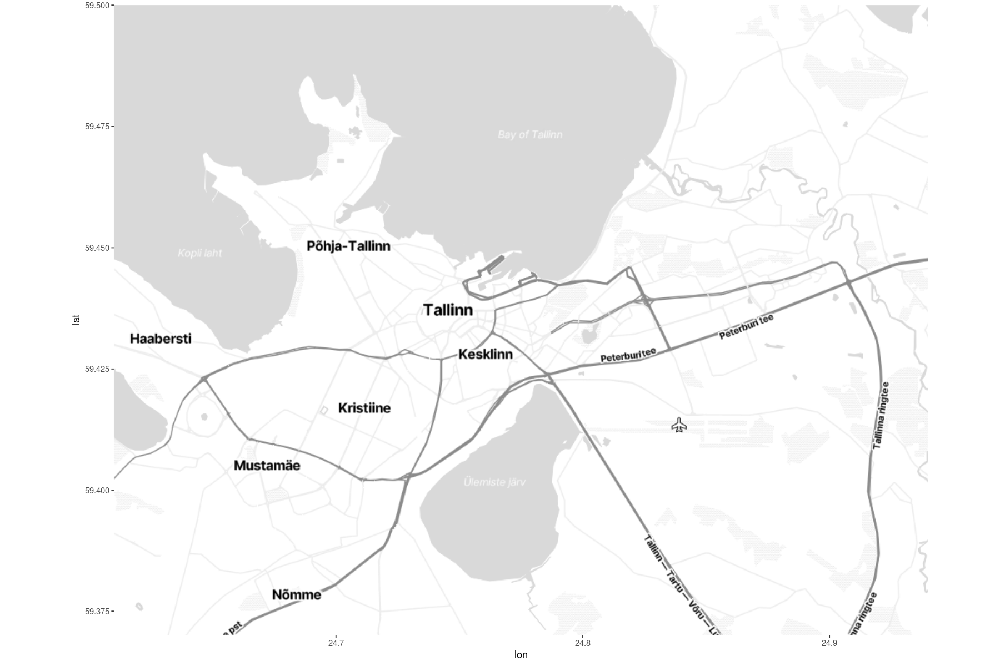

In [12]:
bbox <- c(left = 24.61, bottom = 59.37, right = 24.94, top = 59.5)
get_stadiamap(bbox, zoom = 12, maptype = "stamen_toner_lite") %>% ggmap()

ℹ Using `zoom = 16`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



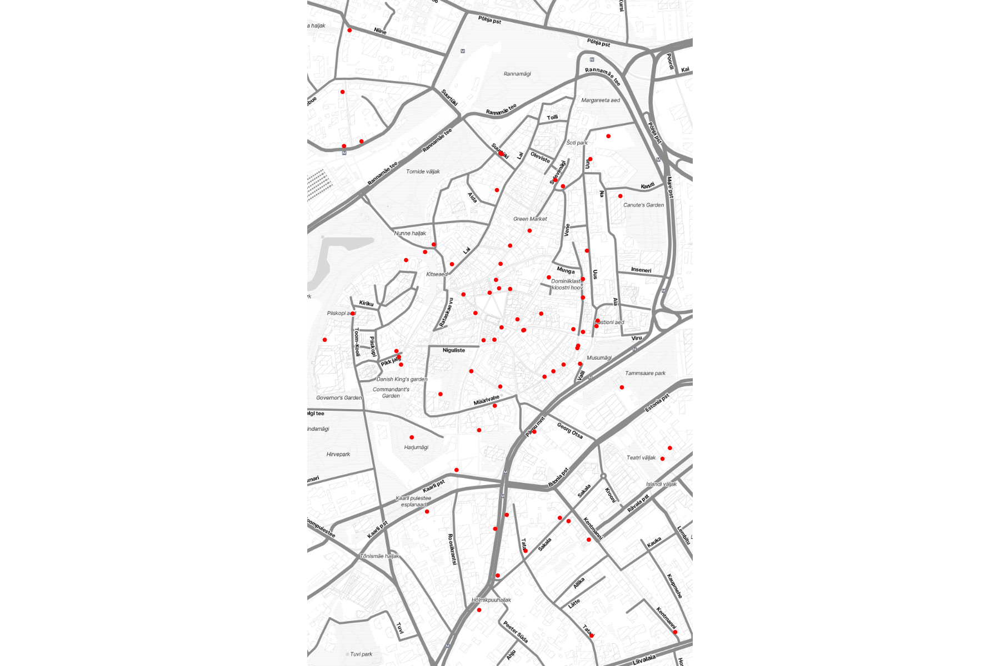

In [13]:
df = data.frame(
  lon = c(24.7408933, 24.7456935, 24.745414, 24.7455573, 24.74466, 24.7420517, 24.7406695, 24.7503795, 24.7451665, 24.7480215, 24.7465048, 24.7476525, 24.7461528, 24.745517, 24.7470942, 24.7456197, 24.7468268, 24.7433477, 24.7439016, 24.7456759, 24.7454717, 24.7492029, 24.7538602, 24.7421455, 24.7442811, 24.7499494, 24.7541156, 24.7496663, 24.7407915, 24.749436, 24.7496639, 24.7473202, 24.7500224, 24.7459907, 24.7435694, 24.737213, 24.7411354, 24.7457404, 24.744481, 24.7461543, 24.7498606, 24.7424696, 24.7478131, 24.7427942, 24.7414089, 24.7495252, 24.749662, 24.7457476, 24.7493961, 24.7483363, 24.7508932, 24.7456813, 24.7514706, 24.7467884, 24.7500806, 24.7381424, 24.7385634, 24.7482397, 24.7487323, 24.7515429, 24.7446615, 24.748973, 24.7485532, 24.7468977, 24.7454333, 24.7384107, 24.7487002, 24.7535016, 24.7389838, 24.7453955, 24.7448729, 24.7380715, 24.7503209),
  lat = c(59.4358885, 59.4383619, 59.4348787, 59.4307098, 59.4342793, 59.4386533, 59.4362213, 59.4369682, 59.4376537, 59.438031, 59.4370001, 59.4371395, 59.4388086, 59.4401727, 59.4391757, 59.4377618, 59.4367379, 59.4383531, 59.4376105, 59.4353492, 59.4379686, 59.4367582, 59.4338407, 59.43228, 59.435726, 59.4315892, 59.4293218, 59.4366903, 59.4360766, 59.4363518, 59.4375351, 59.4342403, 59.4409327, 59.4321987, 59.4333018, 59.4364968, 59.4384542, 59.4368014, 59.437154, 59.4377442, 59.4386843, 59.4388372, 59.435591, 59.4351632, 59.434102, 59.4359086, 59.4379891, 59.441055, 59.4362933, 59.4404203, 59.4414969, 59.4410772, 59.440026, 59.4367293, 59.4292313, 59.4412534, 59.4371417, 59.4357248, 59.4358888, 59.4353297, 59.4298636, 59.4320464, 59.4321256, 59.4313161, 59.4318567, 59.4440948, 59.4402673, 59.4335765, 59.4413692, 59.4364992, 59.4364868, 59.4425823, 59.4368323)
)

qmplot(lon, lat, data = df, maptype = "stamen_toner_lite", color = I("red"))

# Fin installation

Pour une approche plus visuelle et intuitive, nous avons ensuite décidé d'afficher les stations sur un plan grâce aux coordonnées GPS dont nous disposons. De plus, nous avons fait en sorte que les stations soient idenifiables selon leur niveau de remplissage. Pour rappel, plus le remplissage est proche de 1, plus la station aura des Vélib de libres

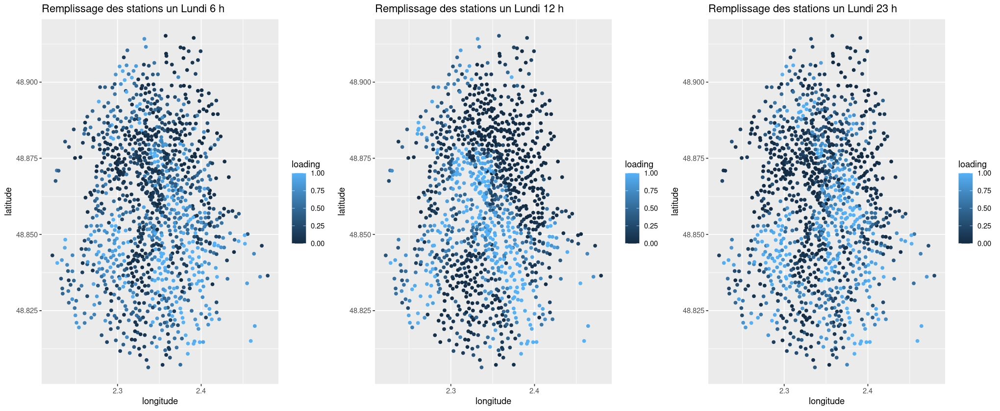

In [14]:
options(repr.plot.width = 17, repr.plot.height = 7)
hours = c(6, 12, 23)

dfi = coord
p = list()
for (i in 1:length(hours)){
    dfi$loading = loading[,hours[i]]
    p[[i]] = ggplot(dfi, aes(x=longitude, y=latitude, color=loading)) + 
        geom_point() +
        labs(title = paste("Remplissage des stations un Lundi",hours[i],"h"))
}
do.call(grid.arrange,c(p, ncol=3))

Le lundi on remarque que le remplissage semble être similaire à 6h et à 23h, cependant à midi on remarque que le centre s'éclaircit. Cela signifie qu'entre 6h et midi, les gens sont venus déposer leurs vélibs en centre-ville, là où la périphérie semble avoir moins de vélibs à proposer. On peut en déduire une tendance à venir de la périphérie vers le centre-ville entre 6h et midi, et l'inverse entre midi et 23h. Cela correspondrait à venir travailler au centre-ville depuis les périphéries en vélo, et revenir chez soi. C'est plausible, surtout dans les cas d'un jour ouvré tel que le lundi.

Nous pouvons affiner un peu plus cette hypothèse en regardant la différence aux horaires des pics que nous avons observé dans les graphiques plus haut : 10h et 20h.

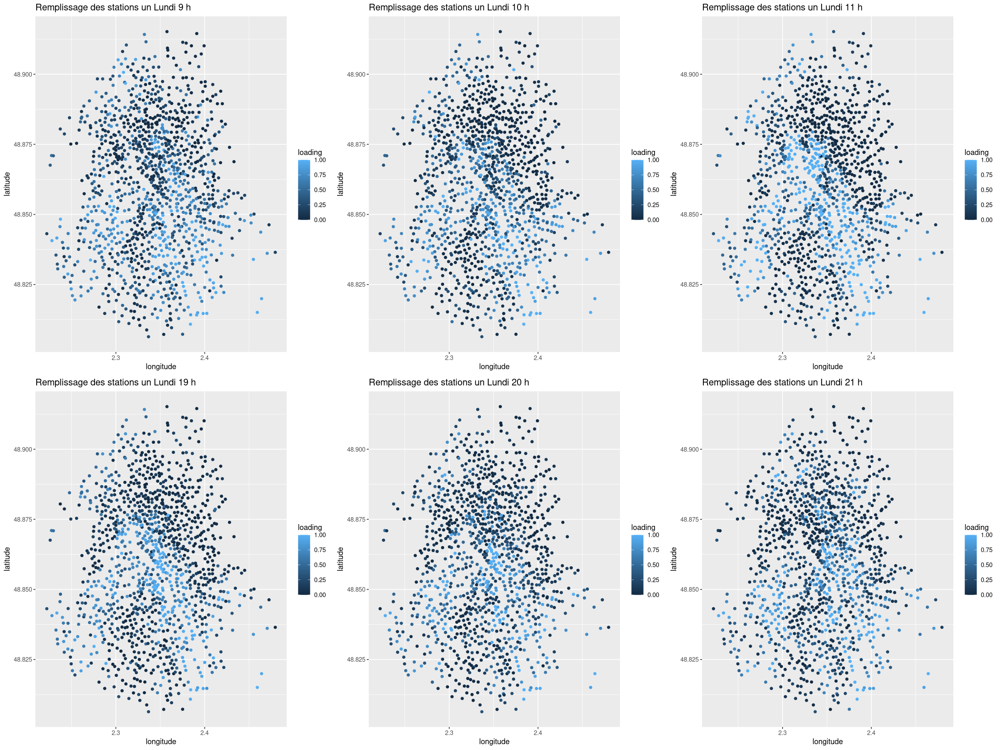

In [15]:
options(repr.plot.width = 20, repr.plot.height = 15)
hours = c(9, 10, 11, 19,20, 21)

dfi = coord
p = list()
for (i in 1:length(hours)){
    dfi$loading = loading[,hours[i]]
    p[[i]] = ggplot(dfi, aes(x=longitude, y=latitude, color=loading)) + 
        geom_point() +
        labs(title = paste("Remplissage des stations un Lundi",hours[i],"h"))
}

do.call(grid.arrange,c(p, ncol=3))

Nous pouvons effectivement noter un fort contraste à 11h entre le centre quasiment rempli, et la périphérie quasiment vide. Ce qui est moins visible à 6h. 
De même, à 21h, on remarque le phénomène inverse, le contraste s'amoindrit par rapport à l'après-midi.


Maintenant que nous avons visualisé cette évolution sur un jour, faisons la même chose mais sur plusieurs jours. Regardons si à un horaire donné, le remplissage selon le jour.

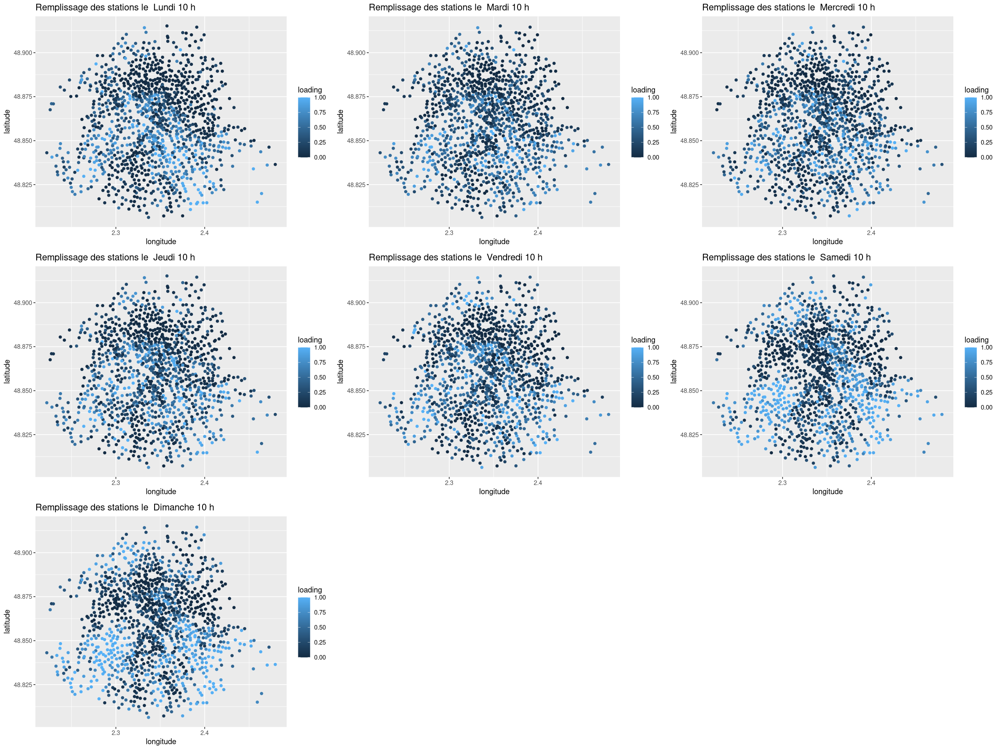

In [16]:
options(repr.plot.width = 20, repr.plot.height = 15)

h = 10
heures = seq(h, 168, 24)
jours  = list("Lundi", "Mardi", "Mercredi","Jeudi", "Vendredi", "Samedi", "Dimanche")

dfi = coord
p = list()
for (i in 1:7){
    dfi$loading = loading[,heures[i]]
    p[[i]] = ggplot(dfi, aes(x=longitude, y=latitude, color=loading)) + 
        geom_point() +
        labs(title = paste("Remplissage des stations le ", jours[i], h,"h"))
}

do.call(grid.arrange,c(p, ncol=3))

On remarque qu'à 10h, il y a plus de vélibs en périphérie les samedis et dimanches que les jours ouvrés. Ce qui semble cohérent puisque les weekends la majorité des personnes ne va pas au travail et n'emprunte donc pas de vélibs pour se déplacer des périphéries vers le centre. 

Voici la moyenne du remplissage des stations sur le plan de Paris.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



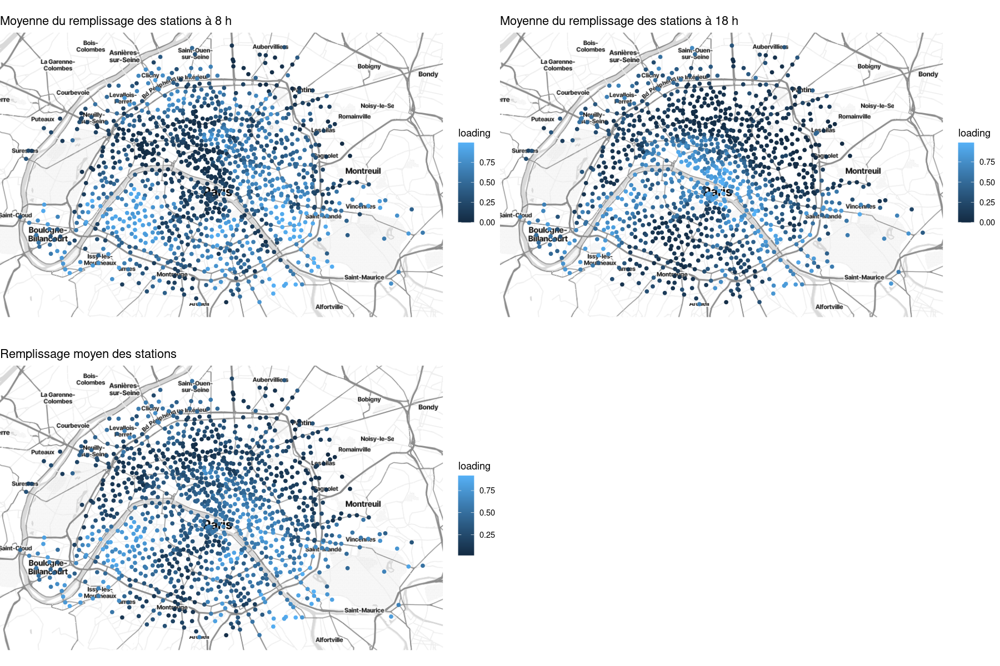

In [17]:
options(repr.plot.width = 15, repr.plot.height =10)
p=list()
h     = 8
heures = seq(h, 168, 24)
R = rowMeans(loading[,heures])

df = coord
df$loading = R

# --- #



p[[1]]=qmplot(data=df, longitude, latitude, color=loading) +
    labs(title = paste('Moyenne du remplissage des stations à',h,'h'))
h     = 18
heures = seq(h, 168, 24)
R = rowMeans(loading[,heures])

df = coord
df$loading = R

# --- #



p[[2]]=qmplot(data=df, longitude, latitude, color=loading) +
    labs(title = paste('Moyenne du remplissage des stations à',h,'h'))

df$loading = rowMeans(loading)
p[[3]]=qmplot(data=df, longitude, latitude, color=loading)  +
        labs(title = paste("Remplissage moyen des stations "))

do.call(grid.arrange,c(p, ncol=2))


On remarque qu'il y a une migration des vélibs qui se produit dans la journée. Au matin (8h), le centre de Paris est vide tandis que les vélos sont concentrés en périphérie. Ils sont déplacés dans la journée, et au soir (18h), ils sont concentrés dans les stations du centre de Paris. Cependant, malgré ce phénomène cyclique,en moyenne, les stations se situant dans les lieux les plus fréquentées de la ville sont plus remplies.


Maintenant que nous avons étudié l'évolution selon l'heure et visualisé ce remplissage sur un plan, il serait intéressant de voir si l'altitude de certaines stations joue un rôle dans leur remplissage.

### Altitude des stations 

In [18]:
nb_pente <- sum(coord$bonus==1)
no_hill <- sum(coord$bonus==0)
print(nb_pente)
print ("Proportion des stations situées en altitude:")
print(nb_pente/(nb_pente+no_hill))



[1] 127
[1] "Proportion des stations situées en altitude:"
[1] 0.1068124


127 soit 10,7% des stations sont situées en altitude à Paris.


Plaçons les sur une map pour plus de clarté.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



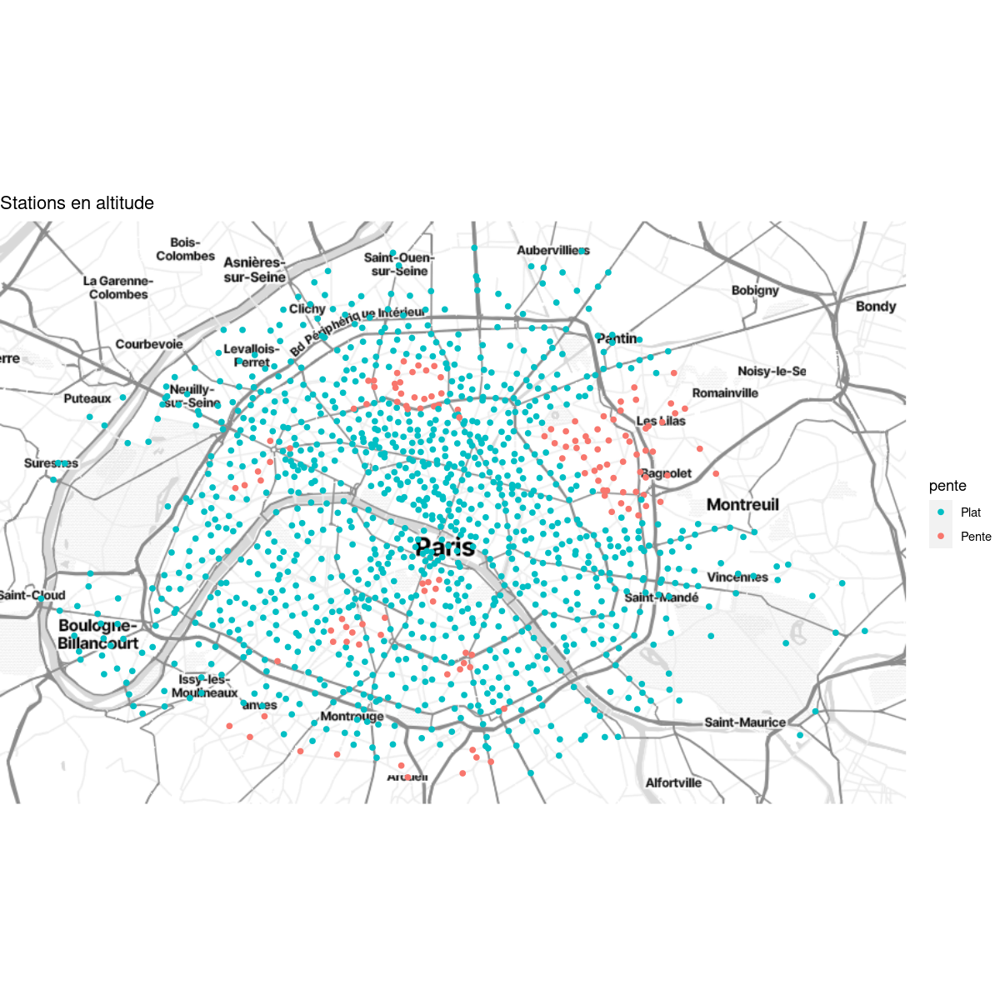

In [19]:
#stations_pente <- coord[coord$pente =='Pente',]
#moyP <- mean(stations_pente)
#print(moyP)
options(repr.plot.width = 10, repr.plot.height = 10)
coord$pente = as.factor(coord$bonus)
levels(coord$pente) = c('Plat','Pente')
qmplot(data=coord, longitude, latitude, color=pente) +

    scale_color_hue(direction = -1) +
    labs(title = 'Stations en altitude')

Les stations en altitudes sont localisées dans sept zones différentes. On remarque également dans l'ensemble, une agglomération de ces stations.

Passons désormais à l'étude du remplissage de ces stations par rapport aux autres pour voir si des tendances se dégagent. pour celà nous allons représenter la moyenne de remplissage des stations en distinguant si elles sont en altitude ou pas

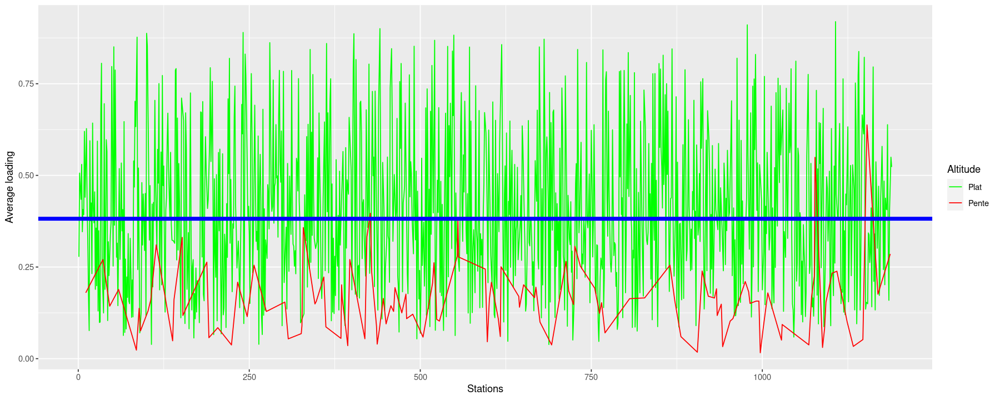

In [20]:

options(repr.plot.width = 15, repr.plot.height = 6)


df = data.frame(stations = c(1:nrow(loading)), mean = rowMeans(loading),bonus=coord$bonus)
# Calculer les moyennes pour bonus = 1 et bonus = 0
mean_bonus_1 <- mean(df[df$bonus == 1, "mean"])
mean_bonus_0 <- mean(df[df$bonus == 0, "mean"])

ggplot(df, aes(x = stations, y = mean, group = bonus, color = factor(bonus))) +
geom_line() +
geom_hline(yintercept = mean(loading), color = 'blue', linewidth=2) +
labs(x = "Stations", y = "Average loading", color = "Altitude") +
scale_color_manual(values = c("green", "red"), labels = c("Plat", "Pente"))



On remarque que la moyenne de remplissage des stations situées en altitude est souvent faible. Ceci est surement liée au fait que monter une pente avec un vélo est difficile. Les personnes auront donc tendance à ne pas fréquenter les stations situées en altitude.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.

ℹ Using `zoom = 12`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



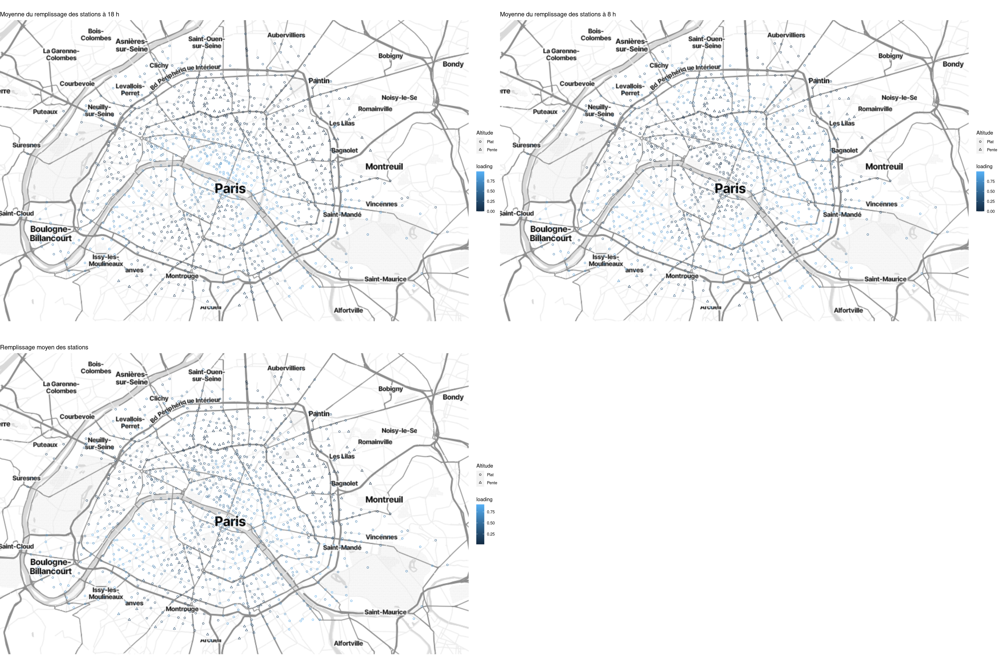

In [21]:
options(repr.plot.width = 30, repr.plot.height =20)
p=list()
h     = 18
heures = seq(h, 168, 24)
R = rowMeans(loading[,heures])

df = coord
df$loading = R

p[[1]]=qmplot(data=df, longitude, latitude, color=loading,shape=factor(coord$pente) ) +
     scale_shape_manual(values=c(1,2) )+
    
    labs(title = paste('Moyenne du remplissage des stations à',h,'h'),shape="Altitude")
h     = 8
heures = seq(h, 168, 24)
R = rowMeans(loading[,heures])

df = coord
df$loading = R

p[[2]]=qmplot(data=df, longitude, latitude, color=loading,shape=factor(coord$pente)) +
 scale_shape_manual(values=c(1,2) )+
    labs(title = paste('Moyenne du remplissage des stations à',h,'h'),shape="Altitude")

df$loading = rowMeans(loading)
p[[3]]=qmplot(data=df, longitude, latitude, color=loading,shape=factor(coord$pente))  +
 scale_shape_manual(values=c(1,2) )+
        labs(title = paste("Remplissage moyen des stations "),shape="Altitude")

do.call(grid.arrange,c(p, ncol=2))


On a vérifié graphiquement que la moyenne de remplissage des stations situées en altitude est souvent faible.

Conclusion: 
De cette première étude des données, on retient que des tendances se dégagent selon la zone géographique des stations : stations au centre ville ou en altitude. De plus, le comportement des utilisateurs n'est pas le même pour un jour ouvré ou non. 
Ceci est une bonne intuition des différents profils qui se dégageront de notre analyse.

## ACP

Notre DataFrame loading contient 168 variables. Ce qui fait beaucoup de variables à analyser. Nous allons donc faire une Analyse en Composantes Principales pour réduire leur nombre. (centré et réduire)

In [22]:
library(FactoMineR)
library(factoextra)

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa



In [23]:
library(ggpubr)  #to get the ggarrange function

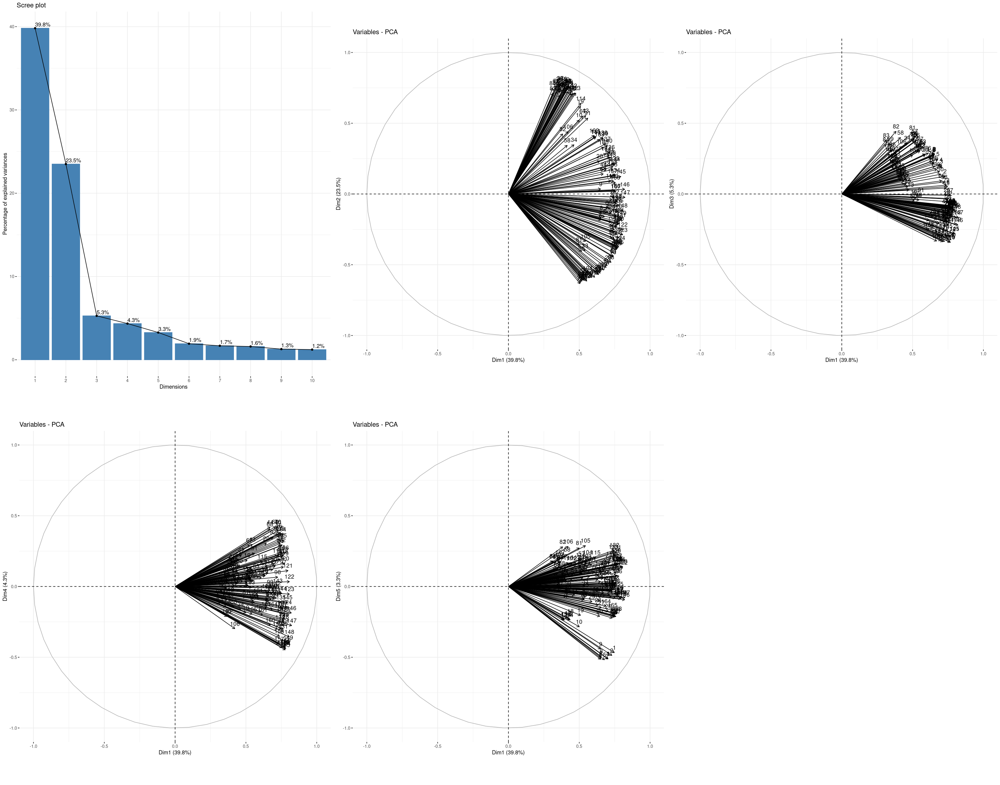

In [24]:

options(repr.plot.width = 28, repr.plot.height = 22)

#loading2 = loading
loading2 = scale(loading, scale=T, center=T) #sc
pca = PCA(loading2, scale.unit = TRUE, graph=FALSE)
# With ggarrange

ggarrange(
    fviz_eig(pca,addlabels = TRUE), 
    fviz_pca_var(pca,axes=c(1,2)),
    fviz_pca_var(pca,axes=c(1,3)),
    fviz_pca_var(pca,axes=c(1,4)),
    fviz_pca_var(pca,axes=c(1,5))
    
)


On choisit de garder cinq dimensions pour expliquer environ 76% de la variance. En effet, la règle suggère de garder environ 80% de l'inertie dans l'idéal, mais pour arriver à ce pourcentage ici on devrait garder huit dimensions. Ceci rendrait notre analyse difficile.

Les projections des variables sur les différents plans factoriels sont illisibles. Comme il s'agit de variables temporelles, nous allons tracer leur corrélation en fonction de chaque dimension. 

integer(0)

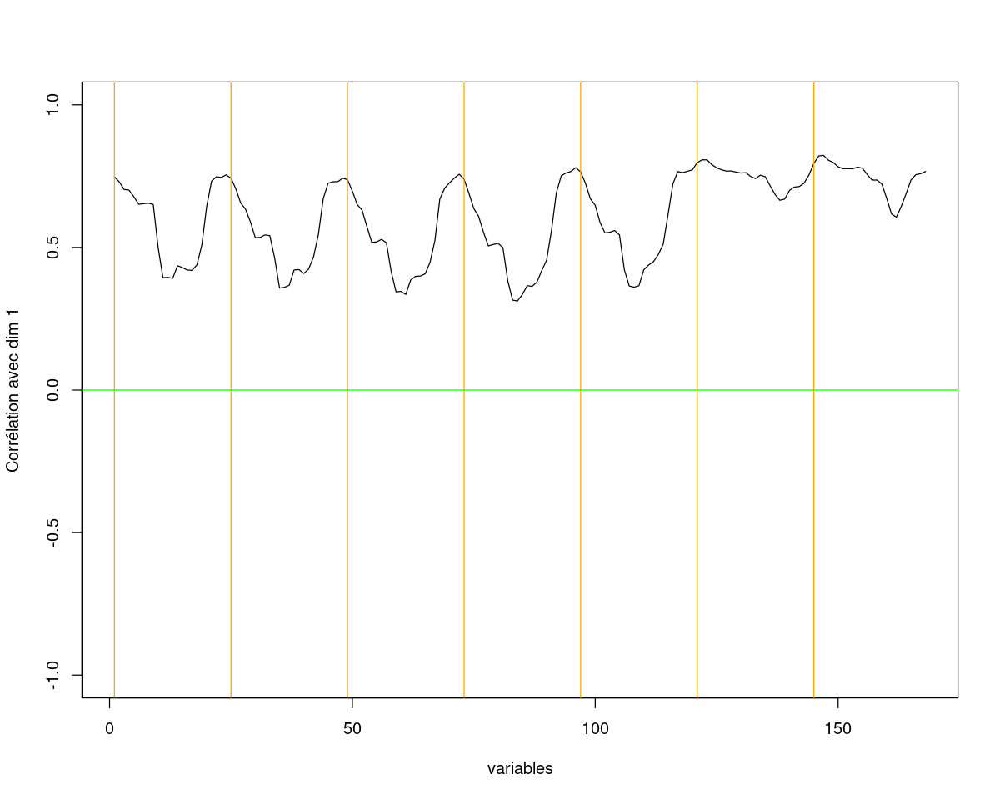

integer(0)

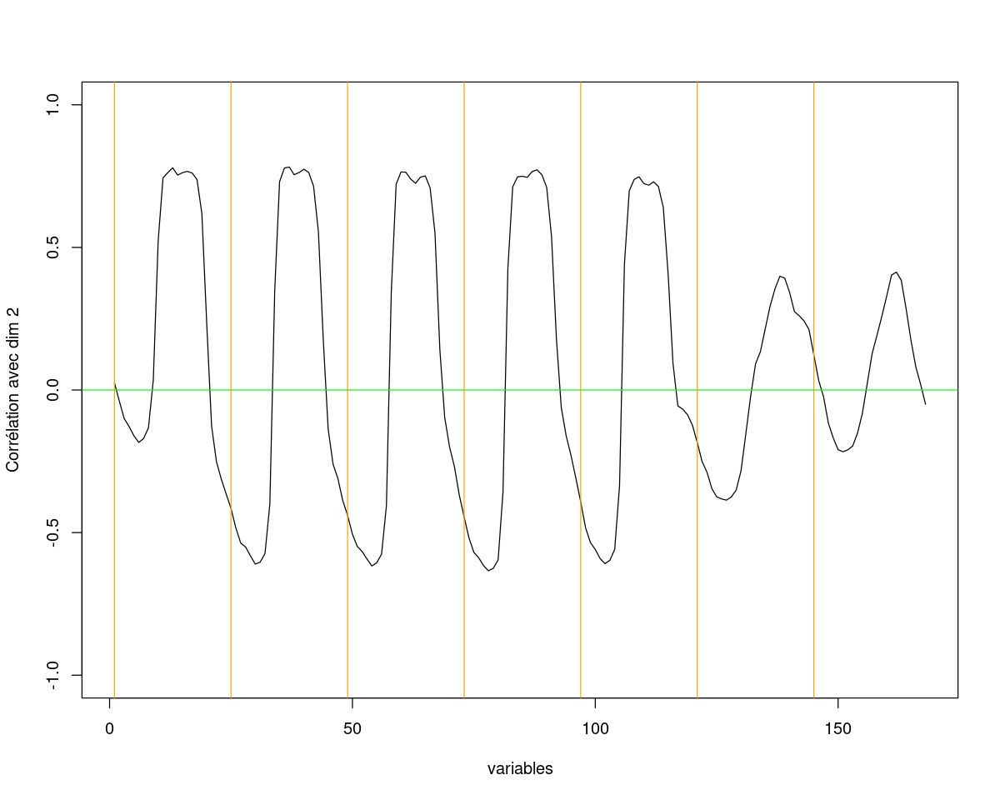

integer(0)

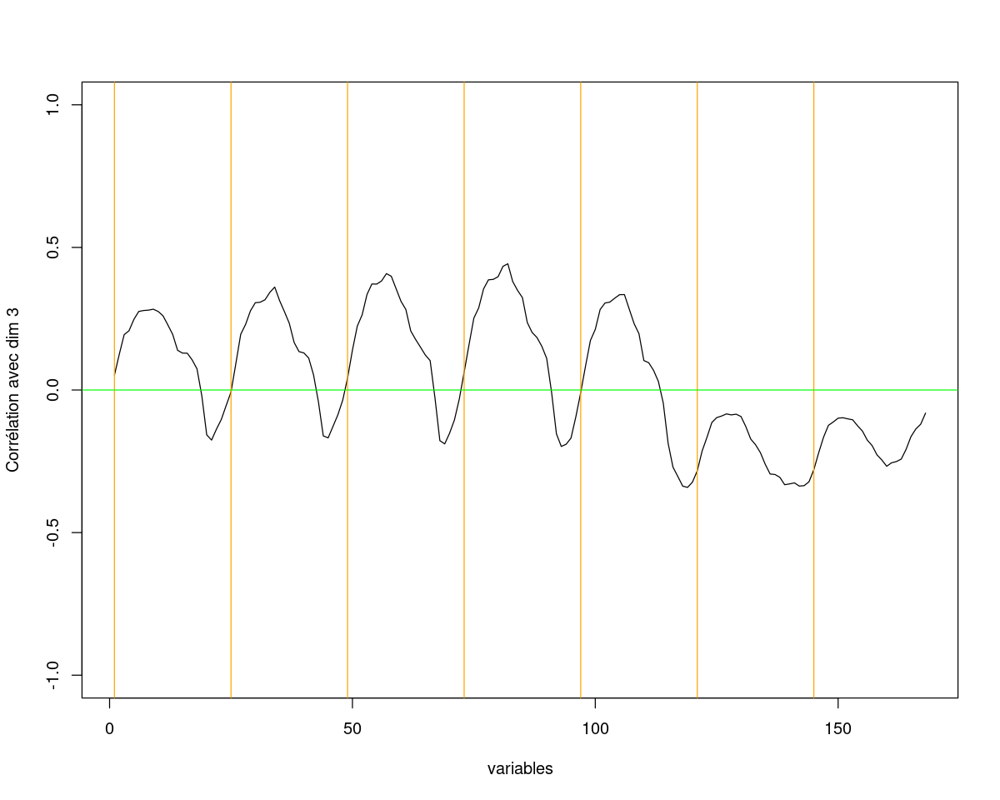

In [52]:
options(repr.plot.width = 10, repr.plot.height = 8)
timeTick = 1 + 24*(0:6)  #  vecteur délimitant les jours


plot(pca$var$coord [,1],type='l',xlab="variables",ylab="Corrélation avec dim 1",ylim=c(-1,1))  + 
abline(v=timeTick, col="orange")+
abline(h=0, col="green")


plot(pca$var$coord [,2],type='l',xlab="variables",ylab="Corrélation avec dim 2",ylim=c(-1,1))  + 
abline(v=timeTick, col="orange")+
abline(h=0, col="green")


plot(pca$var$coord [,3],type='l',xlab="variables",ylab="Corrélation avec dim 3",ylim=c(-1,1))  + 
abline(v=timeTick, col="orange")+
abline(h=0, col="green")



plot(pca$var$coord [,4],type='l',xlab="variables",ylab="Corrélation avec dim 4",ylim=c(-1,1))  + 
abline(v=timeTick, col="orange")+
abline(h=0, col="green")

plot(pca$var$coord [,5],type='l',xlab="variables",ylab="Corrélation avec dim 5",ylim=c(-1,1))  + 
abline(v=timeTick, col="orange")+
abline(h=0, col="green")
'''

On remarque que toutes les variables sont correlées positivement avec la composante 1. Cette composante mesure donc le niveau global de remplissage des stations.  
Les variables représentant les horaires de travail (8h - 19h) sont corrélées positivement avec la dimension 2 tandis que les variables correspondant aux horaires de repos (20h-7h) sont liées négativement à la dimension 2. Elle représente donc la distinction entre les taux de remplissage en temps de travail ou non.

Les variables correspondant au samedi, au dimanche et les jours ouvrés de 19h à 23h ont toutes une corrélation négative avec la dimension 3. Ces horaires semblent liés aux sorties hors travail. Au contraire, les variables correspondant aux jours ouvrés de 0h à 19h sont correlées positivement avec la dimension 3. Elle représente donc le profil des utilisations des vélibs hors cadre professionnel.

## Graphe des individus

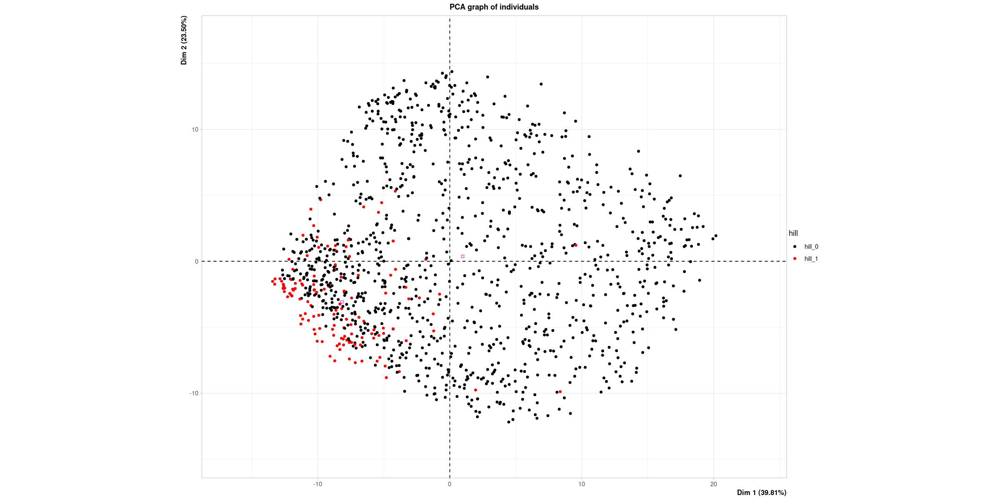

In [26]:
options(repr.plot.width = 20, repr.plot.height = 10)
xhill = data.frame(loading2, hill=as.factor(velib$bonus))
mpca2= PCA(xhill, scale.unit=TRUE, graph=FALSE, quali.sup=169)
plot(mpca2, axes=c(1,2), choix="ind", habillage=169,label="none")

Les individus localisés sur une colline sont regroupés sur le graphique. Ils sont corrélés négativement avec les dimensions 1 et 2. Ce qui traduit le fait que ces stations sont en moyenne moins remplies que celles qui ne sont pas en altitude. De plus, elles sont plutôt utilisées pendant les horaires de repos. 

In [27]:
#plot(pca, axes=c(1,2), choix="ind")

## Clustering avec k-means

Nous allons commencer par chercher le nombre de clusters optimal pour classer les stations de vélibs.

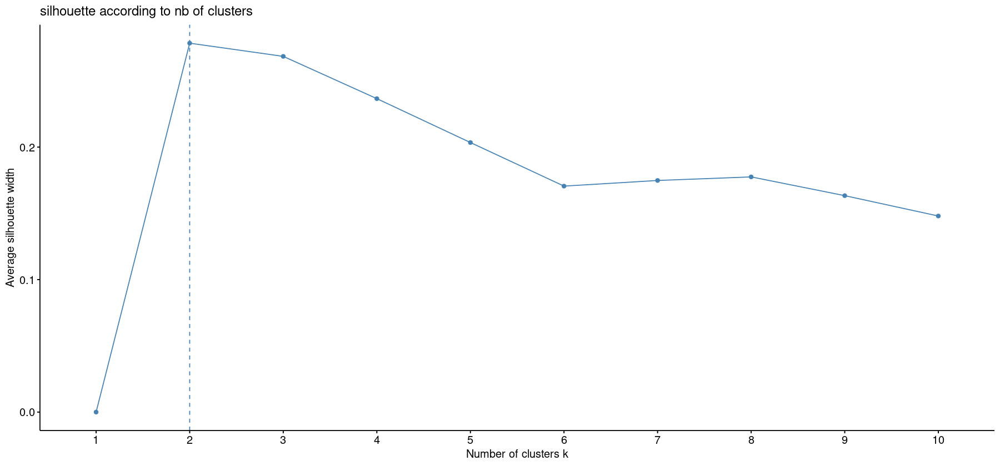

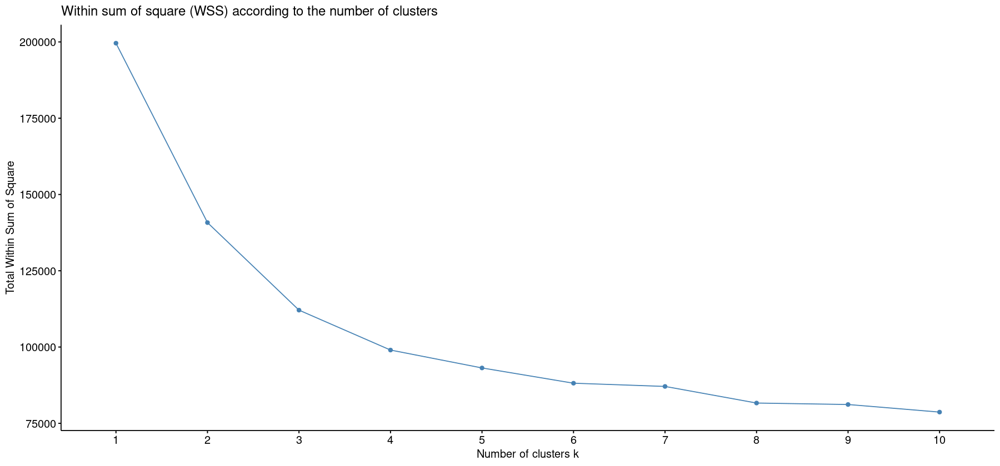

In [28]:
options(repr.plot.width = 15, repr.plot.height = 7)
library(cluster)
fviz_nbclust(loading2,kmeans,method="silhouette")+
     ggtitle("silhouette according to nb of clusters")
fviz_nbclust(loading2, FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

  cluster size ave.sil.width
1       1  723          0.32
2       2  466          0.21


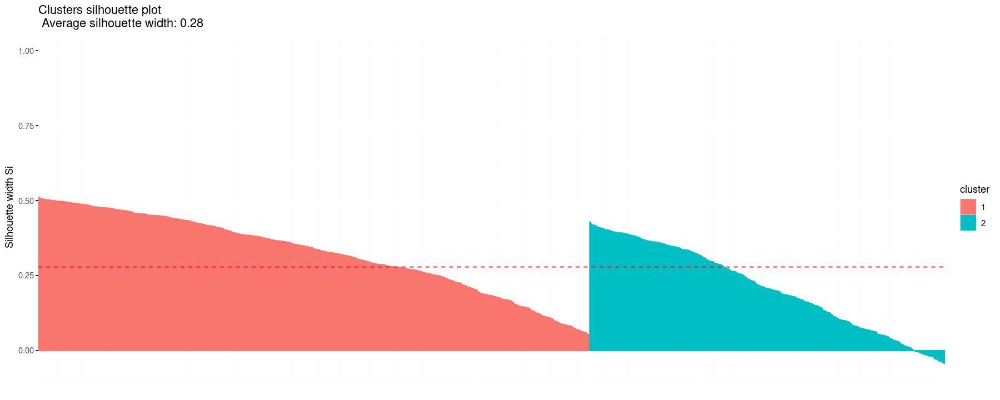

  cluster size ave.sil.width
1       1  370          0.21
2       2  284          0.20
3       3  535          0.34


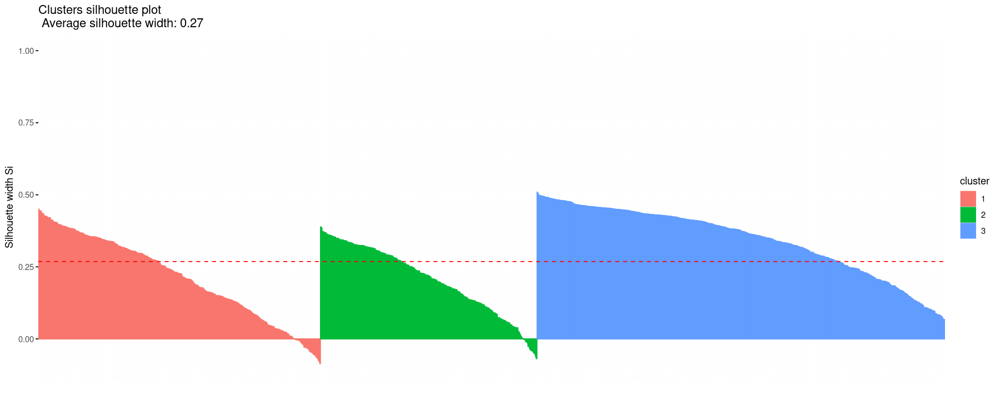

  cluster size ave.sil.width
1       1  235          0.13
2       2  280          0.17
3       3  235          0.22
4       4  439          0.34


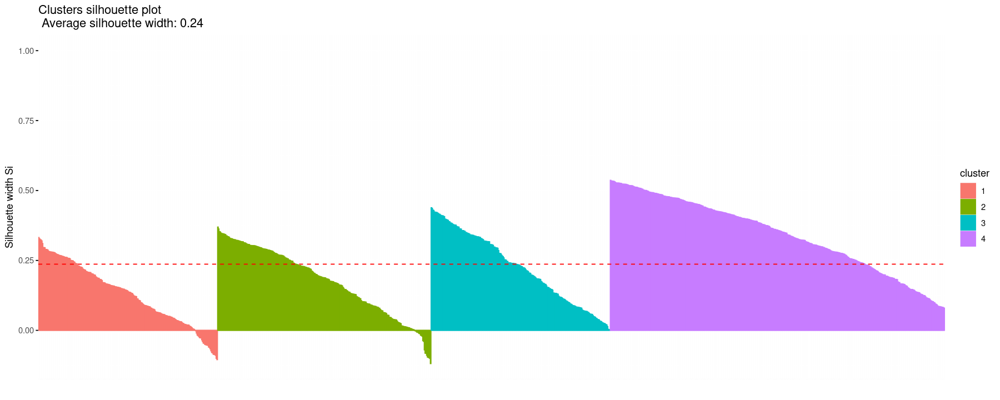

  cluster size ave.sil.width
1       1  240          0.11
2       2  187          0.23
3       3  206          0.23
4       4  407          0.33
5       5  149          0.03


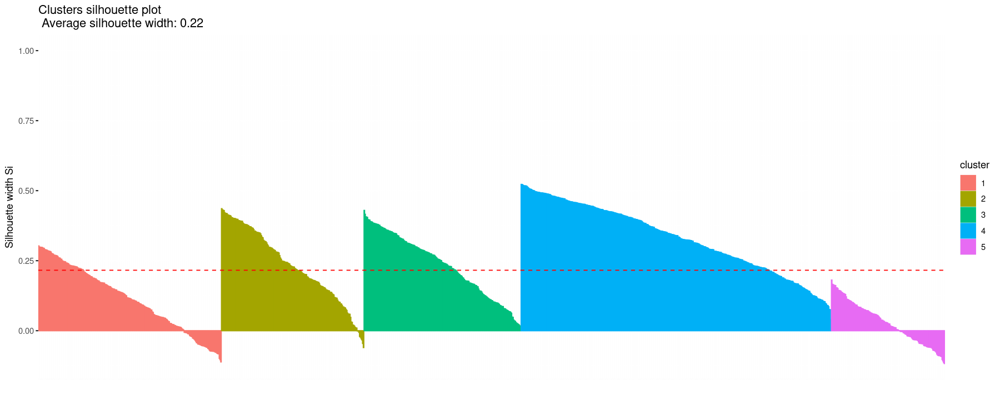

In [29]:
options(repr.plot.width = 15, repr.plot.height = 6)

for (k in 2:5) {
    reskmeans = kmeans(loading2, centers=k) 
    sil = silhouette(reskmeans$cluster, dist(loading2))
    grid.arrange(fviz_silhouette(sil))
}



En utilisant le score silhouette, le nombre de cluster optimal est 2. Cependant, avec la méthode du coude, on utiliserait 4 clusters. Nous allons chercher à comprendre ce que représentent chaque classe dans le cas de 2 ou 4 clusters.

### Cas k=2

In [47]:
k=2
reskmeans = kmeans(loading2,k)
#fviz_cluster(reskmeans, data=loading2, ellipse.type="norm", labelsize=8, geom=c("point"))

#### Comparaison avec la variable bonus

In [48]:
tbl = table(velib$bonus, reskmeans$cluster)
print("Matrice de confusion:")
print(tbl)



[1] "Matrice de confusion:"
   
      1   2
  0 599 463
  1 124   3


Cette classification n'isole pas les stations en fonction de leur altitude. Cependant, la majorité des stations en altitude sont dans le cluster 1. Celles ci ayant une moyenne de remplissage plus faible, cela nous amène à faire une classification en fonction de la moyenne totale de remplissage.

In [49]:
xniv <-data.frame(loading2, niv=as.factor(rowMeans(loading2) > mean(loading2)))
tbl = table(xniv$niv, reskmeans$cluster)
print(tbl)

       
          1   2
  FALSE 632   8
  TRUE   91 458


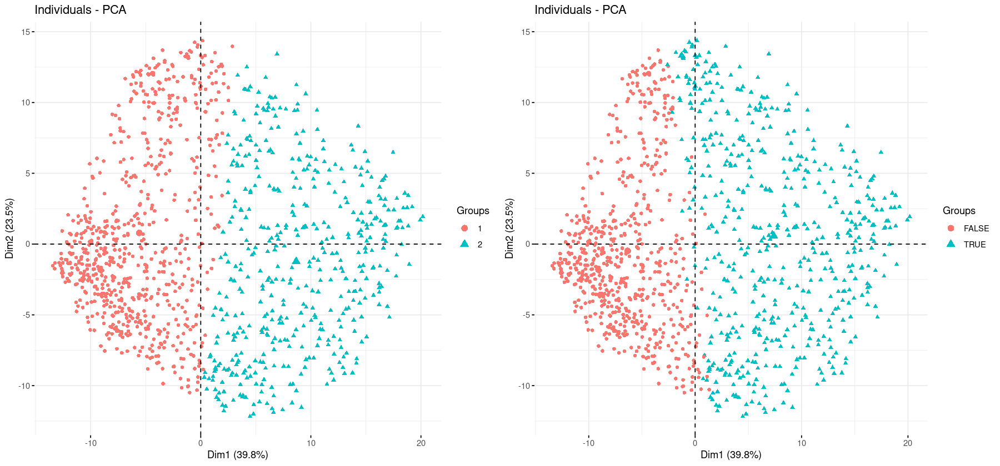

In [50]:
grid.arrange(
   
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point"), habillage=as.factor(reskmeans$cluster)),
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point"), habillage=xniv$niv),
    ncol=2

)

La classification avec 2 clusters en utilisant Kmeans permet de séparer les stations en fonction de leur remplissage moyen. En effet, la table de contingence montre une bonne isolation des stations moins remplies.

### Cas k=4

In [34]:
k=4
reskmeans2 = kmeans(loading2,k)

#### Comparaison avec la variable bonus

[1] "Matrice de confusion:"
   
      1   2   3   4
  0 237 239 276 310
  1  10   1   2 114


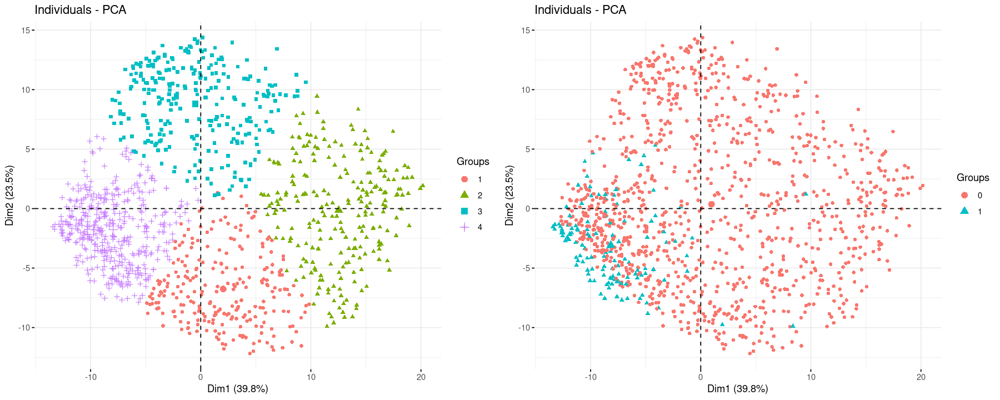

In [35]:
tbl = table(velib$bonus, reskmeans2$cluster)
print("Matrice de confusion:")
print(tbl)

grid.arrange(
   
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point"), habillage=as.factor(reskmeans2$cluster)),
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point"), habillage=as.factor(velib$bonus)),
    ncol=2
)

Avec 4 clusters on n'isole pas bien le fait que les stations soient, ou non, en altitude. Nous allons regarder si on peut mieux distinguer les clusters en les visualisant sur une carte.

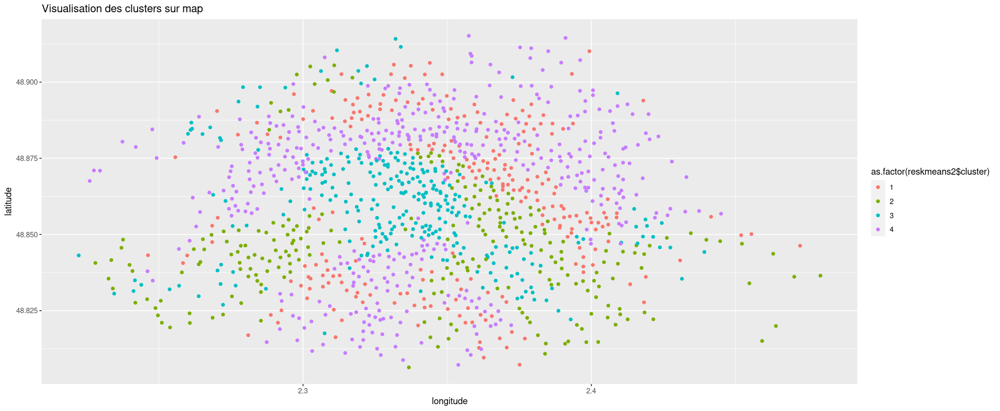

In [36]:
options(repr.plot.width = 17, repr.plot.height = 7)
hours = c(6, 12, 23)

dfi = coord
p = list()
dfi$loading = loading
ggplot(dfi, aes(x=longitude, y=latitude, color=as.factor(reskmeans2$cluster))) + 
    geom_point() +
    labs(title = paste("Visualisation des clusters sur map"))


Avec 4 clusters on n'isole pas non plus sur la carte. HELP NEEDED.

## KMeans avec PCA

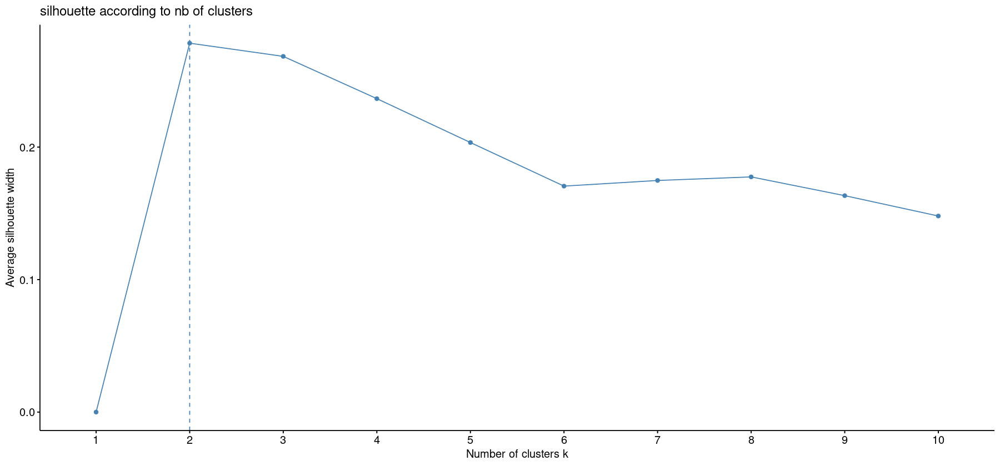

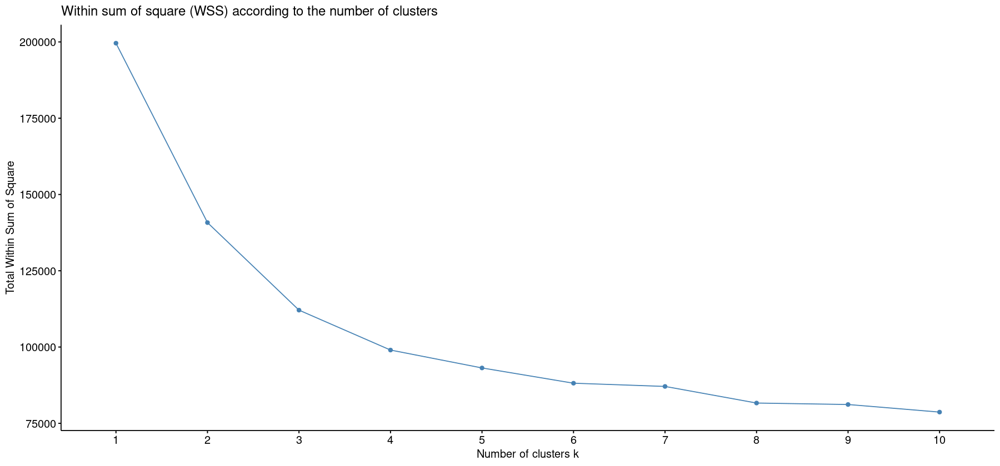

In [37]:
pca_result=prcomp(loading2)
loading_pca <- predict(pca_result)
options(repr.plot.width = 15, repr.plot.height = 7)

fviz_nbclust(loading_pca,kmeans,method="silhouette")+
     ggtitle("silhouette according to nb of clusters")
fviz_nbclust(loading_pca, FUNcluster=kmeans, method="wss") +
    ggtitle("Within sum of square (WSS) according to the number of clusters")

On note qu'en utilisant les données de l'ACP, on tombe sur les mêmes résultats pour le nombre de clusters optimal : 2 avec le score silhouette, 4 avec la méthode du coude.

## Cas k=2 (acp)

In [38]:
k=2
reskmeans3 = kmeans(loading_pca,k)

In [39]:
tbl = table(velib$bonus, reskmeans3$cluster)
print("Matrice de confusion:")
print(tbl)

[1] "Matrice de confusion:"
   
      1   2
  0 599 463
  1 124   3


On retombe sur la même chose que sur les données sans traitement ACP.

In [40]:
xniv <-data.frame(loading_pca, niv=as.factor(rowMeans(loading_pca) > mean(loading_pca)))
tbl = table(xniv$niv, reskmeans3$cluster)
xniv2 <-data.frame(loading2, niv=as.factor(rowMeans(loading2) > mean(loading2)))
tbl2 = table(xniv2$niv, reskmeans$cluster)
print('Avec ACP :')
print(tbl)
print('Sans ACP :')
print(tbl2)

[1] "Avec ACP :"
       
          1   2
  FALSE 495 148
  TRUE  228 318
[1] "Sans ACP :"
       
          1   2
  FALSE 632   8
  TRUE   91 458


Nous constatons une dégradation du clustering en utilisant les données avec traitement ACP.

## Cas k=4 (acp)

In [41]:
k=4
reskmeans4 = kmeans(loading_pca,k)

In [42]:
tbl = table(velib$bonus, reskmeans4$cluster)
tbl2 = table(velib$bonus, reskmeans2$cluster)
print("Matrice de confusion:")
print('Avec ACP :')
print(tbl)
print('Sans ACP :')
print(tbl2)

[1] "Matrice de confusion:"
[1] "Avec ACP :"
   
      1   2   3   4
  0 229 278 321 234
  1   6   2 118   1
[1] "Sans ACP :"
   
      1   2   3   4
  0 237 239 276 310
  1  10   1   2 114


Nous constatons encore une dégradation du clustering en utilisant les données avec traitement ACP.

## CAH

In [ ]:
k=3
d=dist(loading2,method="euclidian")


hclustcomplete = hclust(d,method="complete")
hclustward = hclust(d,method="ward.D")


#fviz_dend(hclustcomplete,k)
fviz_dend(hclustward,k)

In [ ]:
ClassK3 = cutree(hclustward, 4)
#table(ClassK3, wine$Quality)



options(repr.plot.width = 10, repr.plot.height = 6)

ggarrange(
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point"), habillage=as.factor(ClassK3)),
    fviz_pca_ind(pca, axes=c(1,2), geom=c("point"), habillage=as.factor(velib$bonus))
    
    
)





In [ ]:
tbl = table(velib$bonus, ClassK3)
print(tbl)

options(repr.plot.width = 9, repr.plot.height = 6)
mosaicplot(tbl, color=c(2:4))


# GMM

In [ ]:
install.packages('mclust')
library(mclust)

In [ ]:
resBICall = Mclust(loading2, G=2:20)
summary(resBICall)

fviz_mclust(resBICall, what="BIC")